<a href="https://colab.research.google.com/github/Erike-Simon/CESAR-AED/blob/main/MoDesc_cluster_humanitarian_help_PCA_TSNE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Atividade:** *Clusterização - Classificação de Países em Necessidade de Ajuda Humanitária aplicando PCA e TSNE*

**Grupo 3:**
* *Anna Carolina de Roldão*
* *Arthur Lira*
* *Erike Simon*
* *José Aparecido Silvano de Albuquerque*
* *Yaci Mair da Silva Ribeiro*

**Descrição**

Você é um analista de dados em uma ONG humanitária internacional que arrecadou cerca de R$ 100 bilhões para auxiliar países em necessidade. O CEO da ONG precisa decidir como usar esses fundos de forma estratégica e eficaz, priorizando os países mais necessitados. Sua tarefa é realizar uma análise de classificação dos países com base em fatores socioeconômicos e de saúde, determinando o desenvolvimento geral das nações.

# Configurações

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/devjaynemorais/modelos_descritivos_curso/main/Aula%2002/dados/country_data.csv')
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [ ]:
!pip install ydata-profiling

In [ ]:
from pandas_profiling import ProfileReport

<ipython-input-4-e2a33329b6f0>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Análise e visulização de dados via YdataProfiling

In [ ]:
profile = ProfileReport(df, title='Relatório de Perfil de Dados', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Observando o heatmap de correlações, nota-se que existe uma correlação negativa forte (-0.876) entre as features 'gdpp' (produto interno bruto per capita) e 'child_mort' (mortlidade infantil). Por outro lado, 'gdpp' e 'life_expec' possuem correlação positiva forte (0.851). Dentro as demais correlações fortes entre outras features, opta-se por estas citadas por se tratarem de características mais valiosas para a análise e uma intuitiva visualização dos clusters a serem formados.

Transformando dados categóricos da coluna 'country' em numéricos

In [ ]:
le = preprocessing.LabelEncoder()
le.fit(df['country'])
df['country_le'] = le.transform(df['country'])

Normalização de dados

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
print(scaler.fit(df[['child_mort', 'exports', 'health', 'imports', 'income', 'inflation',
                     'life_expec', 'total_fer', 'gdpp']].values))
print(scaler.mean_)
print(scaler.transform(df[['child_mort', 'exports', 'health', 'imports', 'income', 'inflation',
                           'life_expec', 'total_fer', 'gdpp']].values))

df[['child_mort_std', 'exports_std', 'health_std', 'imports_std', 'income_std', 'inflation_std',
    'life_expec_std', 'total_fer_std', 'gdpp_std']] = scaler.transform(df[['child_mort', 'exports', 'health', 'imports', 'income', 'inflation',
                                                                           'life_expec', 'total_fer', 'gdpp']].values)

features = ['child_mort_std', 'exports_std', 'health_std', 'imports_std', 'income_std', 'inflation_std',
            'life_expec_std', 'total_fer_std', 'gdpp_std']

StandardScaler()
[3.82700599e+01 4.11089760e+01 6.81568862e+00 4.68902150e+01
 1.71446886e+04 7.78183234e+00 7.05556886e+01 2.94796407e+00
 1.29641557e+04]
[[ 1.29153238 -1.13827979  0.27908825 ... -1.61909203  1.90288227
  -0.67917961]
 [-0.5389489  -0.47965843 -0.09701618 ...  0.64786643 -0.85997281
  -0.48562324]
 [-0.27283273 -0.09912164 -0.96607302 ...  0.67042323 -0.0384044
  -0.46537561]
 ...
 [-0.37231541  1.13030491  0.0088773  ...  0.28695762 -0.66120626
  -0.63775406]
 [ 0.44841668 -0.40647827 -0.59727159 ... -0.34463279  1.14094382
  -0.63775406]
 [ 1.11495062 -0.15034774 -0.33801514 ... -2.09278484  1.6246091
  -0.62954556]]


# Sem redução de dimensionalidade

## Método

Utilizando o modelo Kmeans

Elbow Method




In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Choosing the number of clusters using the elbow method
inertia = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(df[features])
    inertia.append(kmeans.inertia_)

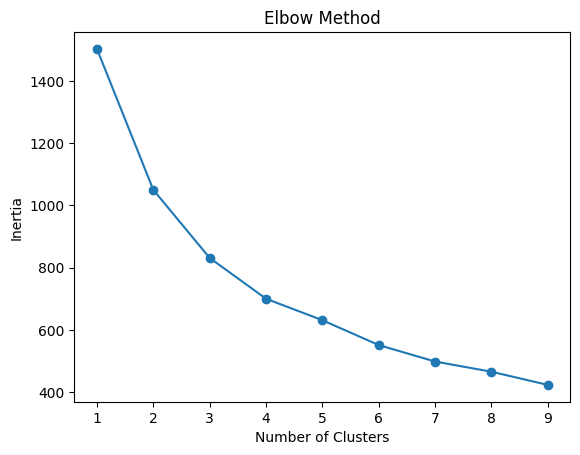

In [ ]:
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

Gráfico 1

O interesse é subdividir os países em 2 (necessitados | não necessitados)  ou 3 classes no máximo (urgentemente necessitados | necessitados | não necessitados). Portanto, serão testados e analisados *k=2* e *k=3* apenas.

In [ ]:
import matplotlib.animation as animation
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.metrics import davies_bouldin_score

Plot para 'gdpp' e 'child_mort' (*k=2* e *k=3*)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


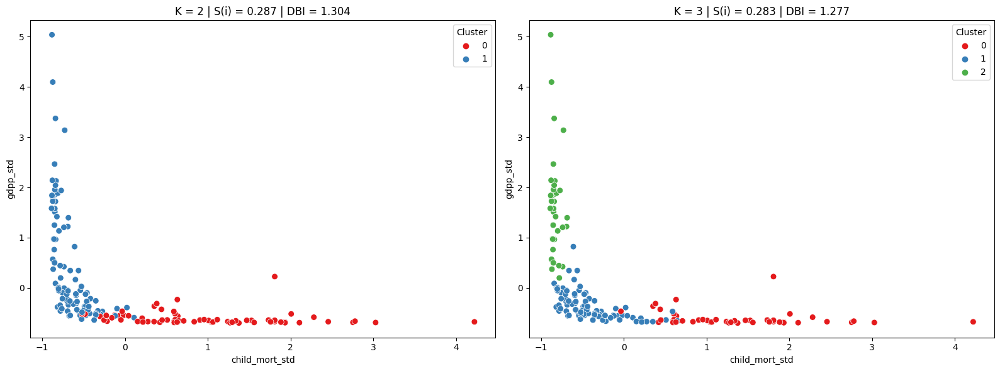

In [ ]:
# Define o número de clusters que você deseja visualizar
num_clusters = [2, 3]

# Calcula o número de linhas e colunas para o grid de gráficos
rows = 1
cols = len(num_clusters)

slt_scores = [] # To store scores for Silhouette Analysis
dbi_scores = [] # To store scores using the Davies-Boldin Index

# Cria uma figura com o número apropriado de subplots
fig, axes = plt.subplots(rows, cols, figsize=(16, 6))

# Loop através de cada valor de k
for i, k in enumerate(num_clusters):
    # Aplica o K-Means com o valor atual de k
    kmeans = KMeans(n_clusters=k, random_state=0)
    df['Cluster'] = kmeans.fit_predict(df[features])
    df['Cluster'] = df['Cluster'].astype(str)

    # Calcula a pontuação de silhueta
    slt_score = round(metrics.silhouette_score(df[features], kmeans.labels_, metric='euclidean'), 3)
    slt_scores.append(slt_score)

    # calculates and stores the Davies-Boldin Index
    dbi_score = round(davies_bouldin_score(df[features], kmeans.labels_), 3)
    dbi_scores.append(dbi_score)

    # Gráfico de dispersão dos pontos de dados com cores de cluster
    sns.scatterplot(ax=axes[i], data=df, s=50, x='child_mort_std',
                     y='gdpp_std', hue='Cluster', palette='Set1')

    # Adiciona o valor de k e a pontuação de silhueta ao título
    axes[i].set_title(f'K = {k} | S(i) = {slt_score} | DBI = {dbi_score}')

# Ajusta o layout
plt.tight_layout()
plt.show()

Gráfico 2

Plot para 'gdpp' e 'life_expec' (*k=2* e *k=3*)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


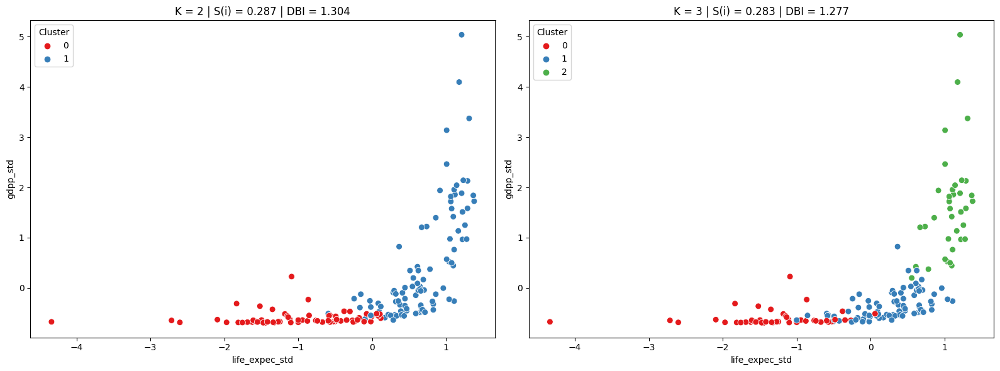

In [ ]:
# Define o número de clusters que você deseja visualizar
num_clusters = [2, 3]

# Calcula o número de linhas e colunas para o grid de gráficos
rows = 1
cols = len(num_clusters)

slt_scores = [] # To store scores for Silhouette Analysis
dbi_scores = [] # To store scores using the Davies-Boldin Index

# Cria uma figura com o número apropriado de subplots
fig, axes = plt.subplots(rows, cols, figsize=(16, 6))

# Loop através de cada valor de k
for i, k in enumerate(num_clusters):
    # Aplica o K-Means com o valor atual de k
    kmeans = KMeans(n_clusters=k, random_state=0)
    df['Cluster'] = kmeans.fit_predict(df[features])
    df['Cluster'] = df['Cluster'].astype(str)

    # Calcula a pontuação de silhueta
    slt_score = round(metrics.silhouette_score(df[features], kmeans.labels_, metric='euclidean'), 3)
    slt_scores.append(slt_score)

    # calculates and stores the Davies-Boldin Index
    dbi_score = round(davies_bouldin_score(df[features], kmeans.labels_), 3)
    dbi_scores.append(dbi_score)

    # Gráfico de dispersão dos pontos de dados com cores de cluster
    sns.scatterplot(ax=axes[i], data=df, s=50, x='life_expec_std',
                     y='gdpp_std', hue='Cluster', palette='Set1')

    # Adiciona o valor de k e a pontuação de silhueta ao título
    axes[i].set_title(f'K = {k} | S(i) = {slt_score} | DBI = {dbi_score}')

# Ajusta o layout
plt.tight_layout()
plt.show()

Gráfico 3

Plot para 'gdpp' e 'health' (*k=2* e *k=3*)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


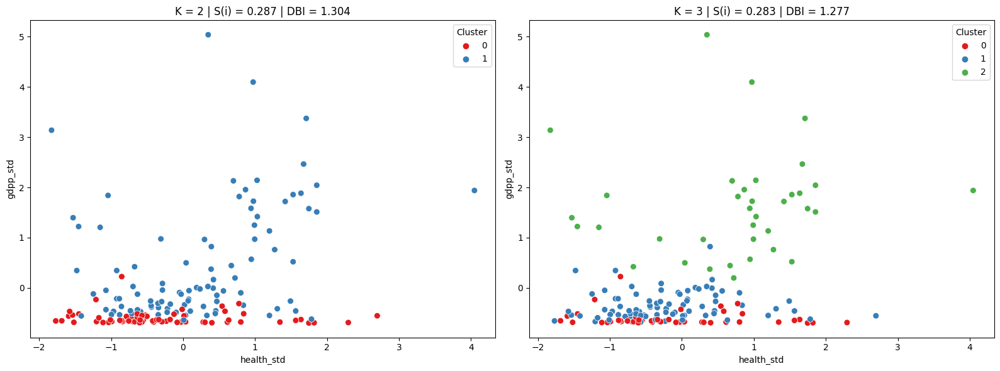

In [ ]:
# Define o número de clusters que você deseja visualizar
num_clusters = [2, 3]

# Calcula o número de linhas e colunas para o grid de gráficos
rows = 1
cols = len(num_clusters)

slt_scores = [] # To store scores for Silhouette Analysis
dbi_scores = [] # To store scores using the Davies-Boldin Index

# Cria uma figura com o número apropriado de subplots
fig, axes = plt.subplots(rows, cols, figsize=(16, 6))

# Loop através de cada valor de k
for i, k in enumerate(num_clusters):
    # Aplica o K-Means com o valor atual de k
    kmeans = KMeans(n_clusters=k, random_state=0)
    df['Cluster'] = kmeans.fit_predict(df[features])
    df['Cluster'] = df['Cluster'].astype(str)

    # Calcula a pontuação de silhueta
    slt_score = round(metrics.silhouette_score(df[features], kmeans.labels_, metric='euclidean'), 3)
    slt_scores.append(slt_score)

    # calculates and stores the Davies-Boldin Index
    dbi_score = round(davies_bouldin_score(df[features], kmeans.labels_), 3)
    dbi_scores.append(dbi_score)

    # Gráfico de dispersão dos pontos de dados com cores de cluster
    sns.scatterplot(ax=axes[i], data=df, s=50, x='health_std',
                     y='gdpp_std', hue='Cluster', palette='Set1')

    # Adiciona o valor de k e a pontuação de silhueta ao título
    axes[i].set_title(f'K = {k} | S(i) = {slt_score} | DBI = {dbi_score}')

# Ajusta o layout
plt.tight_layout()
plt.show()

Gráfico 4

## Métricas

Davies-Boldin Index

In [ ]:
for k in range(2, 4):
  print(f'K={k} -> Davies-Boldin Index: {dbi_scores[k-2]}')

K=2 -> Davies-Boldin Index: 1.304
K=3 -> Davies-Boldin Index: 1.277


Silhouette Analysis

Plot para features 'gdpp' e 'life_expec' (*k=2* e *k=3*)

For k = 2 The average silhouette_score is : 0.29
For k = 3 The average silhouette_score is : 0.28


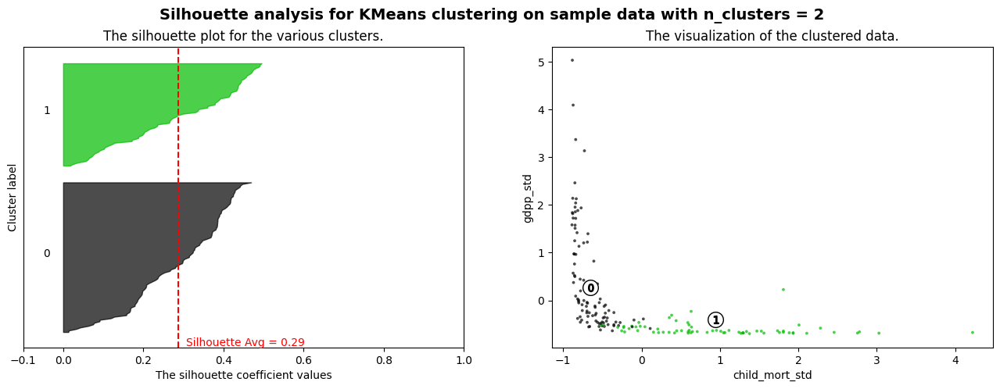

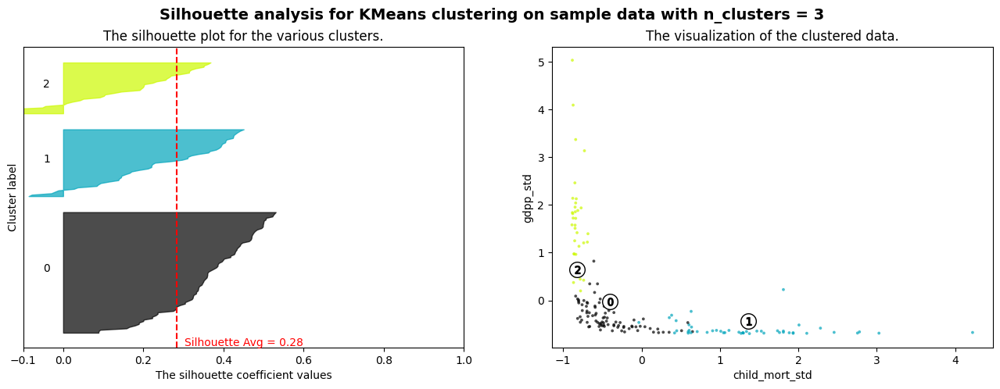

In [ ]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [2, 3]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(16, 5)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df[features]) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(df[features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df[features], cluster_labels)
    print(
        "For k =",
        n_clusters,
        "The average silhouette_score is :",
        round(silhouette_avg, 2)
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df[features], cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    # Adds the value of silhouette_avg next to the vertical line
    ax1.text(silhouette_avg + 0.02, 0.9, f'Silhouette Avg = {silhouette_avg:.2f}', color='red', fontsize=10)

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        df['child_mort_std'], df['gdpp_std'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("child_mort_std")
    ax2.set_ylabel("gdpp_std")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

Gráfico 5

Pele observação dos gráficos 2 e 5 para *k=2* (com *S(i)=0.29* e *DBI=1.304*), observa-se uma menor sobreposição dos clusters formados em detrimento dos respectivos gráficos para *k=3*. Outro fator importante é que as features 'gdpp' e 'child_mort' possuem correlação negativa mais forte (*-0.876*) do que 'gdpp' em relação a demais features. Entende-se, portanto, que a falta de recursos afeta fortemente a mortalidade infantil e por consequência a expectativa de vida (onde 'child_mort' e 'life_expec' possuem correlação negativa forte de *-0.906*, o que significa que se a morttalidade infantil decair, a expectativa de vida tende a aumentar). Sendo assim, para contemplar mais países com ajuda humanitária, a escolha das classificações entre os países será feita em dois grupos: **necessitados**(0, vermelho) e **não necessitados**(1, azul).

Para *k=2*

In [ ]:
kmeans2 = KMeans(n_clusters=2, random_state=0)
df['Cluster'] = kmeans2.fit_predict(df[features])
df['Cluster'] = df['Cluster'].astype(str)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


'df_country' possui todas as informações dos países classificados como 'necessitados' (Cluster 0)

In [ ]:
df_country = df[df['Cluster'] == '0']

Cálculo para rankeamento dos países dos mais necessitados para os menos necessitados

In [ ]:
# Combinação das Métricas
df_country['rank'] = df_country['gdpp_std']*0.2 + df_country['life_expec_std']*0.2 + df_country['child_mort_std']*0.3 + df_country['health_std']*0.3

In [ ]:
# Ordenamento através do ranking criado, dos menores rankeados (menores pontuações) para os maiores rankeados (maiores pontuações)
df_country1 = df_country.sort_values(by='rank', ascending=True)
df_country1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,...,exports_std,health_std,imports_std,income_std,inflation_std,life_expec_std,total_fer_std,gdpp_std,Cluster,rank
50,Eritrea,55.2,4.790,2.66,23.3000,1420,11.60,61.7,4.61,482,...,-1.328914,-1.517449,-0.977347,-0.818131,0.362289,-0.998780,1.101191,-0.683065,0,-0.665286
38,"Congo, Rep.",63.9,85.100,2.46,54.7000,5190,20.70,60.4,4.95,2740,...,1.609635,-1.590479,0.323561,-0.621984,1.225748,-1.145399,1.326459,-0.559500,0,-0.626893
70,Indonesia,33.3,24.300,2.61,22.4000,8430,15.30,69.9,2.48,3110,...,-0.615042,-1.535707,-1.014634,-0.453412,0.713366,-0.073951,-0.310052,-0.539252,0,-0.620435
120,Philippines,31.9,34.800,3.61,36.6000,5600,4.22,69.0,3.16,2130,...,-0.230846,-1.170557,-0.426325,-0.600652,-0.337967,-0.175457,0.140486,-0.592881,0,-0.552363
107,Myanmar,64.4,0.109,1.97,0.0659,3720,7.04,66.8,2.41,988,...,-1.500192,-1.769403,-1.939940,-0.698465,-0.070389,-0.423582,-0.356431,-0.655375,0,-0.551651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,Timor-Leste,62.6,2.200,9.12,27.8000,1850,26.50,71.1,6.23,3600,...,-1.423682,0.841419,-0.790911,-0.795759,1.776084,0.061390,2.174530,-0.512438,0,0.343747
26,Burundi,93.6,8.920,11.60,39.2000,764,12.30,57.7,6.26,231,...,-1.177797,1.746991,-0.318607,-0.852261,0.428709,-1.449916,2.194407,-0.696801,0,0.507582
88,Liberia,89.3,19.100,11.80,92.6000,700,5.47,60.8,5.02,327,...,-0.805310,1.820021,1.893764,-0.855591,-0.219360,-1.100286,1.372838,-0.691547,0,0.568384
101,"Micronesia, Fed. Sts.",40.0,23.500,14.20,81.0000,3340,3.80,65.4,3.46,2860,...,-0.644314,2.696381,1.413174,-0.718236,-0.377819,-0.581479,0.339252,-0.552933,0,0.594939


Dessa forma, os recursos de 10 bilhões para ajuda humanitária podem ser destinados para os países mais necessitados seguindo a ordem de rankeamento presente no 'df_country1'.

# PCA

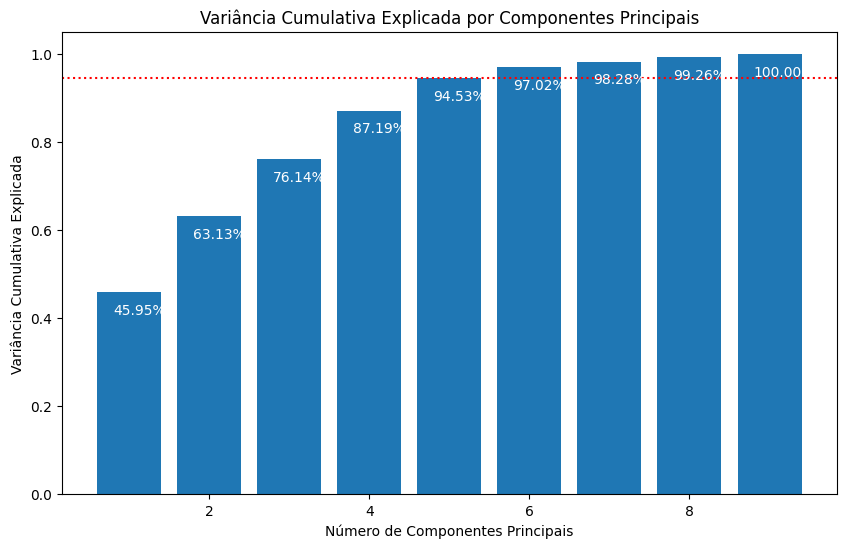

In [ ]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Inicialize o PCA com o número de componentes desejado ou None para manter todos os componentes
n_components = None
pca = PCA(n_components=n_components)

# Ajuste o modelo PCA aos seus dados
pca.fit(df[features])

# Calcule a variância explicada cumulativa
explained_variance_ratio_cumulative = np.cumsum(pca.explained_variance_ratio_)

# Crie um gráfico da variância cumulativa
plt.figure(figsize=(10, 6))
bars = plt.bar(range(1, len(explained_variance_ratio_cumulative) + 1), explained_variance_ratio_cumulative)
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Variância Cumulativa Explicada')
plt.title('Variância Cumulativa Explicada por Componentes Principais')
plt.axhline(y=0.9453, c='red', linestyle=':')

# Adicione as porcentagens como rótulos nas barras
for bar, explained_variance in zip(bars, explained_variance_ratio_cumulative):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.2, bar.get_height() - 0.05, f'{explained_variance:.2%}', fontsize=10, color='white')

plt.show()

## 5 componentes

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=5, random_state=0)

principalComponents = pca.fit_transform(df[features])

columns = []

for i in range(principalComponents.shape[1]):
  columns.append(f'Principal component {i}')

principalDf = pd.DataFrame(data = principalComponents, columns = columns)

principalDf

,Principal component 0,Principal component 1,Principal component 2,Principal component 3,Principal component 4
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475
3,-2.932423,1.695555,1.525044,0.839625,-0.273209
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007
...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595,-0.395748
163,-0.551036,-1.233886,3.101350,-0.115311,2.082581
164,0.498524,1.390744,-0.238526,-1.074098,1.176081
165,-1.887451,-0.109453,1.109752,0.056257,0.618365


In [ ]:
pca.explained_variance_ratio_

array([0.4595174 , 0.17181626, 0.13004259, 0.11053162, 0.07340211])

### Método (5 componentes)

In [ ]:
import matplotlib.animation as animation
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.metrics import davies_bouldin_score

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Choosing the number of clusters using the elbow method
inertia = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(principalDf)
    inertia.append(kmeans.inertia_)

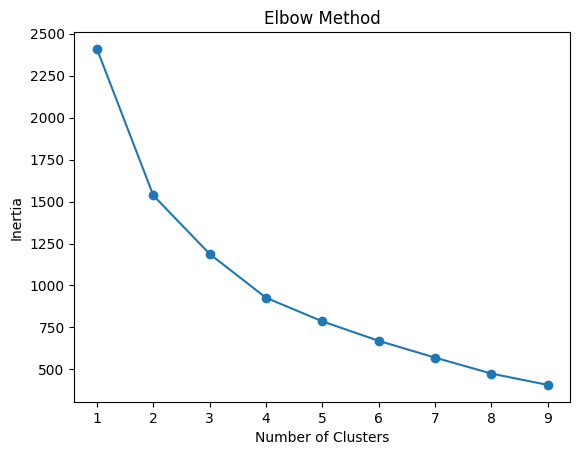

In [ ]:
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

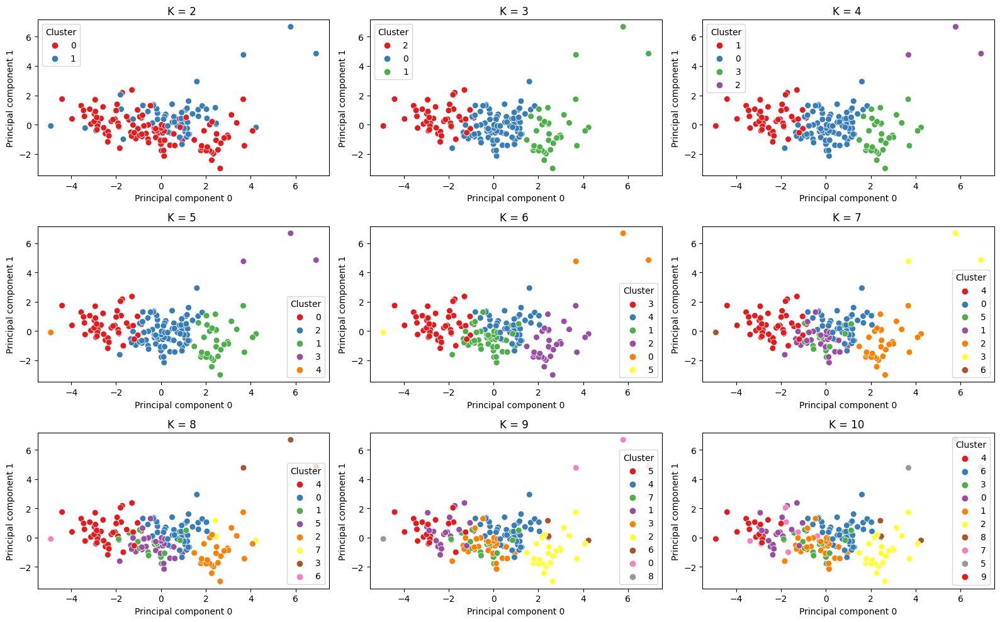

In [ ]:
# Define the number of clusters you want to visualize
num_clusters = 10

slt_scores = [] # To store scores for Silhouette Analysis
dbi_scores = [] # To store scores using the Davies-Boldin Index

# Calculate the number of rows and columns for the grid of plots
rows = (num_clusters + 1) // 3
cols = 3

# Create a grid of subplots
fig, axes = plt.subplots(rows, cols, figsize=(16, 10))

# Loop through each value of k
for k in range(2, num_clusters + 1):
    row = (k - 2) // cols
    col = (k - 2) % cols

    # Apply K-Means with the current value of k
    kmeans = KMeans(n_clusters=k, random_state=0)
    principalDf['Cluster'] = kmeans.fit_predict(principalDf)
    principalDf['Cluster'] = principalDf['Cluster'].astype(str)

    # calculates and stores silhouette scores
    slt_score = round(metrics.silhouette_score(principalDf, kmeans.labels_, metric='euclidean'), 3)
    slt_scores.append(slt_score)

    # calculates and stores the Davies-Boldin Index
    dbi_score = round(davies_bouldin_score(principalDf, kmeans.labels_), 3)
    dbi_scores.append(dbi_score)

    # Scatter plot of data points with cluster coloring
    ax = sns.scatterplot(ax=axes[row, col], data=principalDf, s=50, x='Principal component 0',
                         y='Principal component 1', hue='Cluster', palette='Set1')
    # Add the value of k to the title
    ax.set_title(f'K = {k} ')

# Adjust layout
plt.tight_layout()
plt.show()

### Métricas (5 componentes)

Davies-Boldin Index

In [ ]:
for k in range(2, num_clusters + 1):
  print(f'K={k} -> Davies-Boldin Index: {dbi_scores[k-2]}')

K=2 -> Davies-Boldin Index: 2.496
K=3 -> Davies-Boldin Index: 1.103
K=4 -> Davies-Boldin Index: 0.877
K=5 -> Davies-Boldin Index: 0.761
K=6 -> Davies-Boldin Index: 0.705
K=7 -> Davies-Boldin Index: 0.829
K=8 -> Davies-Boldin Index: 0.74
K=9 -> Davies-Boldin Index: 0.752
K=10 -> Davies-Boldin Index: 0.709


Silhouette Analysis

For k = 2 The average silhouette_score is : 0.32
For k = 3 The average silhouette_score is : 0.33
For k = 4 The average silhouette_score is : 0.41
For k = 5 The average silhouette_score is : 0.35
For k = 6 The average silhouette_score is : 0.35
For k = 7 The average silhouette_score is : 0.43
For k = 8 The average silhouette_score is : 0.39
For k = 9 The average silhouette_score is : 0.39
For k = 10 The average silhouette_score is : 0.41


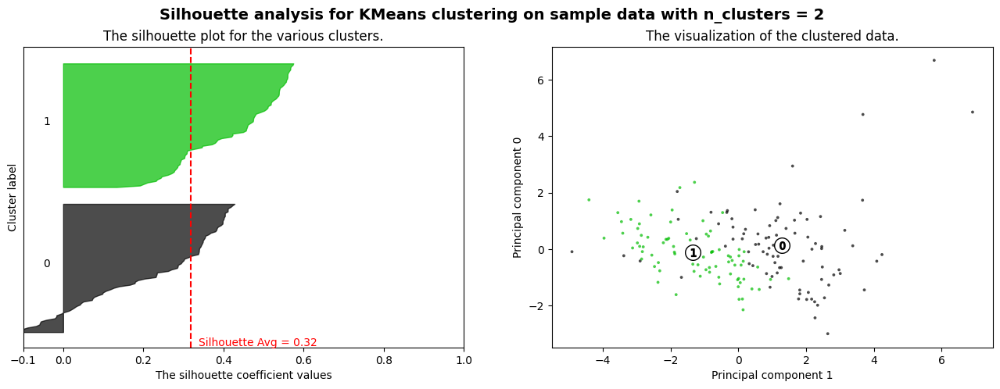

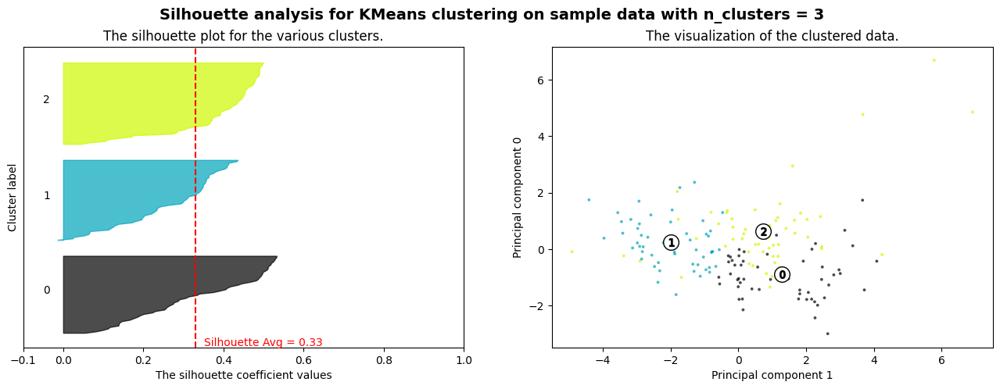

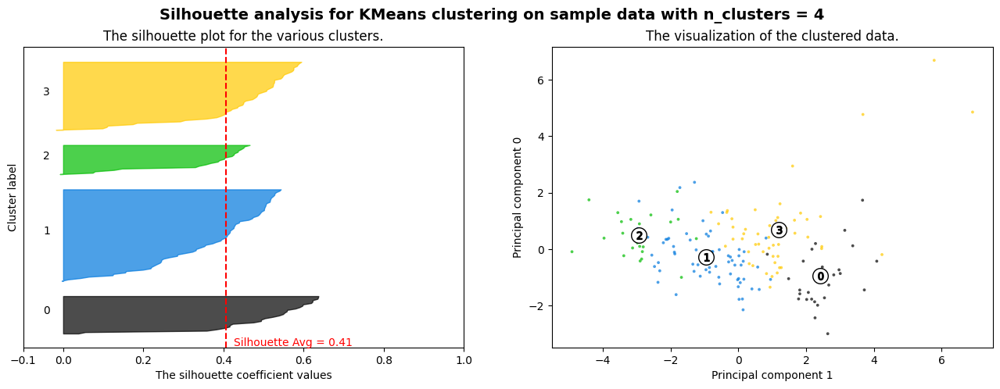

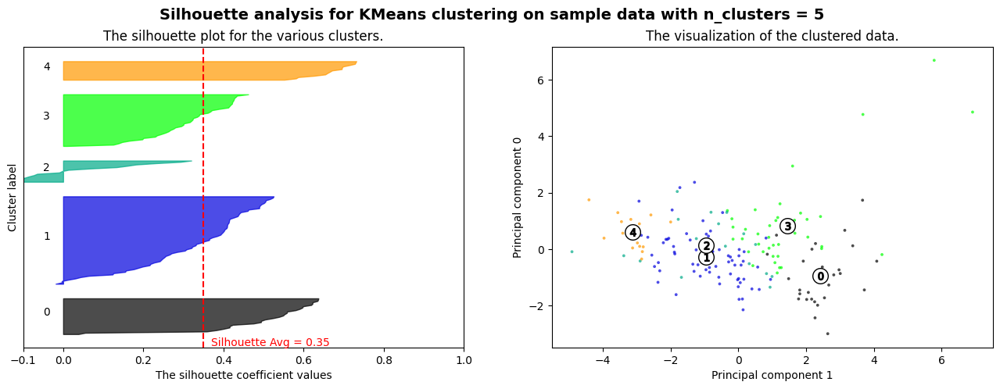

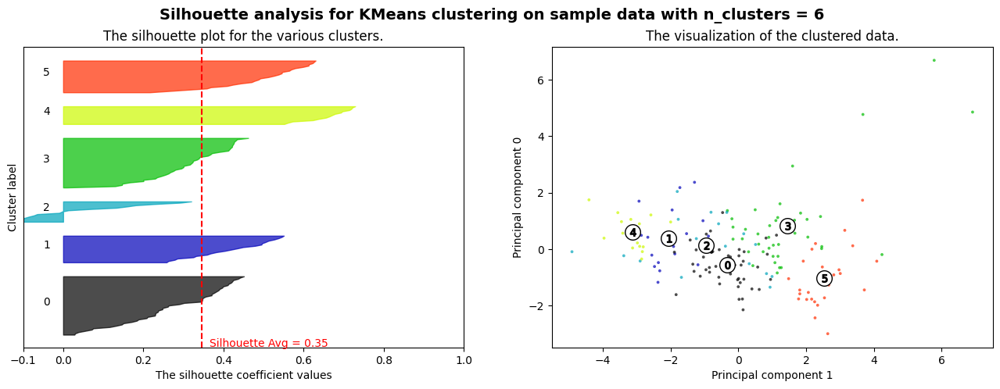

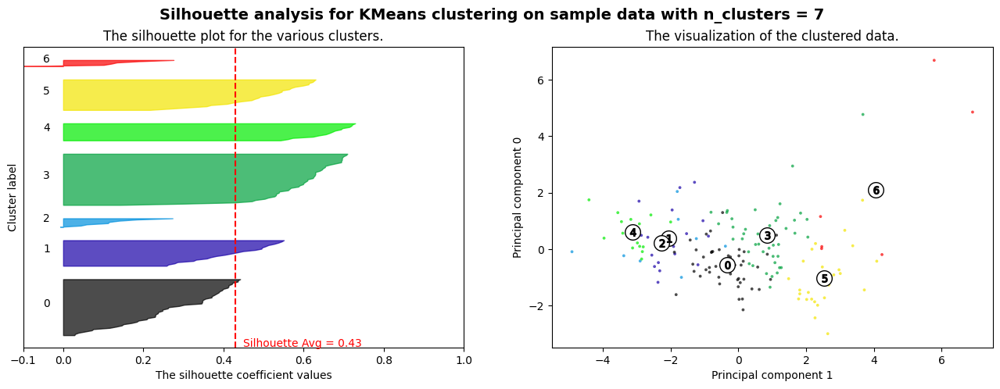

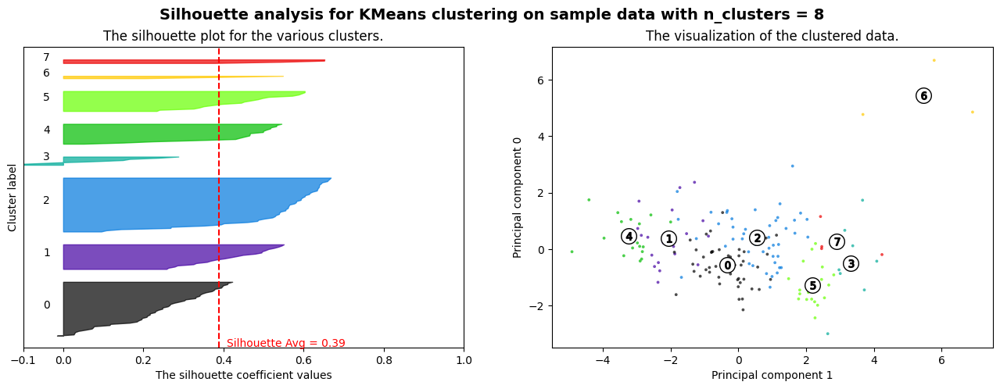

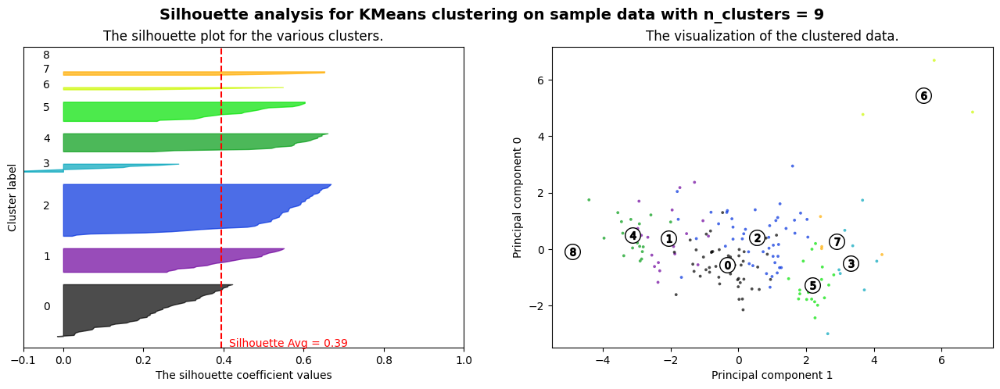

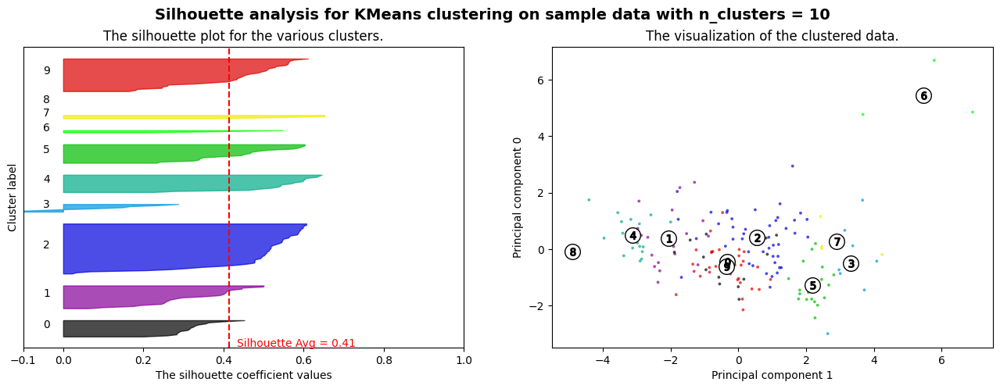

In [ ]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(16, 5)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(principalDf) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(principalDf)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(principalDf, cluster_labels)
    print(
        "For k =",
        n_clusters,
        "The average silhouette_score is :",
        round(silhouette_avg, 2)
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(principalDf, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    # Adds the value of silhouette_avg next to the vertical line
    ax1.text(silhouette_avg + 0.02, 0.9, f'Silhouette Avg = {silhouette_avg:.2f}', color='red', fontsize=10)

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        principalDf['Principal component 0'], principalDf['Principal component 1'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Principal component 1")
    ax2.set_ylabel("Principal component 0")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

## 2 componentes

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=0)

principalComponents = pca.fit_transform(df[features])

columns = []

for i in range(principalComponents.shape[1]):
  columns.append(f'Principal component {i}')

principalDf2 = pd.DataFrame(data = principalComponents, columns = columns)

principalDf2

,Principal component 0,Principal component 1
0,-2.913025,0.095621
1,0.429911,-0.588156
2,-0.285225,-0.455174
3,-2.932423,1.695555
4,1.033576,0.136659
...,...,...
162,-0.820631,0.639570
163,-0.551036,-1.233886
164,0.498524,1.390744
165,-1.887451,-0.109453


In [ ]:
pca.explained_variance_ratio_

array([0.4595174 , 0.17181626])

### Método (2 componentes)

In [ ]:
# Choosing the number of clusters using the elbow method
inertia = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(principalDf2)
    inertia.append(kmeans.inertia_)

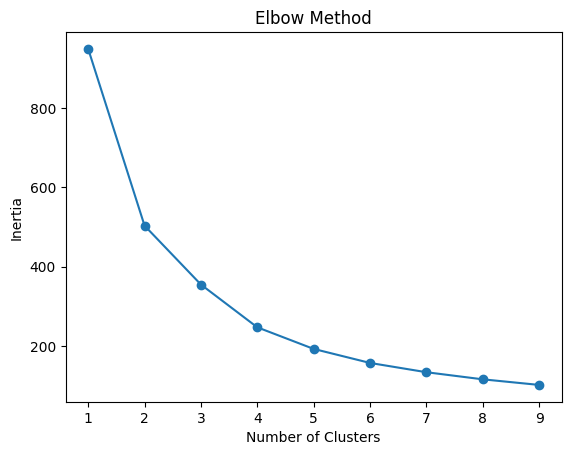

In [ ]:
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

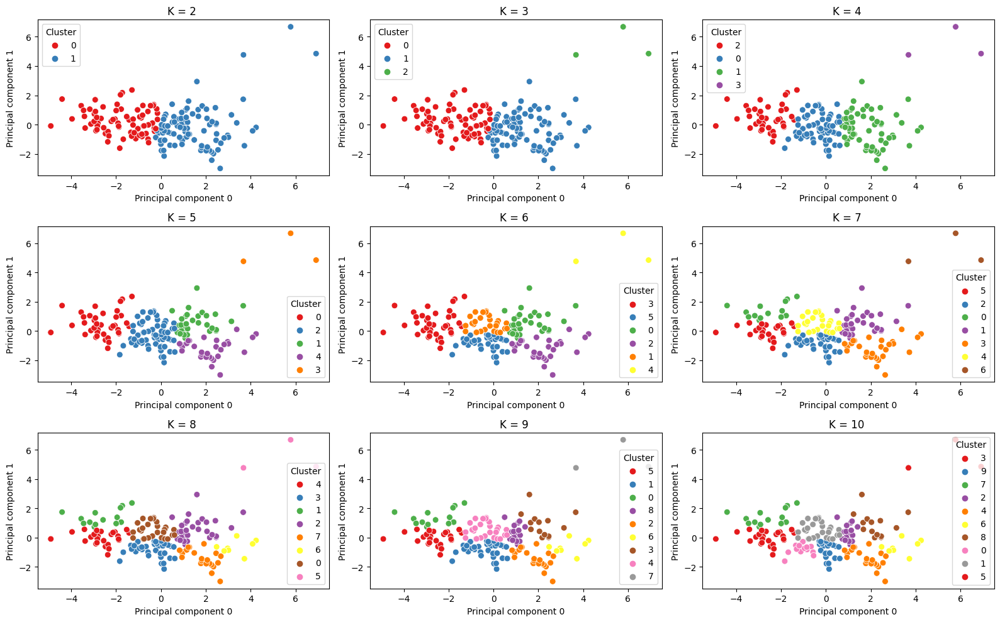

In [ ]:
# Define the number of clusters you want to visualize
num_clusters = 10

slt_scores = [] # To store scores for Silhouette Analysis
dbi_scores = [] # To store scores using the Davies-Boldin Index

# Calculate the number of rows and columns for the grid of plots
rows = (num_clusters + 1) // 3
cols = 3

# Create a grid of subplots
fig, axes = plt.subplots(rows, cols, figsize=(16, 10))

# Loop through each value of k
for k in range(2, num_clusters + 1):
    row = (k - 2) // cols
    col = (k - 2) % cols

    # Apply K-Means with the current value of k
    kmeans = KMeans(n_clusters=k, random_state=0)
    principalDf2['Cluster'] = kmeans.fit_predict(principalDf2)
    principalDf2['Cluster'] = principalDf2['Cluster'].astype(str)

    # calculates and stores silhouette scores
    slt_score = round(metrics.silhouette_score(principalDf2, kmeans.labels_, metric='euclidean'), 3)
    slt_scores.append(slt_score)

    # calculates and stores the Davies-Boldin Index
    dbi_score = round(davies_bouldin_score(principalDf2, kmeans.labels_), 3)
    dbi_scores.append(dbi_score)

    # Scatter plot of data points with cluster coloring
    ax = sns.scatterplot(ax=axes[row, col], data=principalDf2, s=50, x='Principal component 0',
                         y='Principal component 1', hue='Cluster', palette='Set1')
    # Add the value of k to the title
    ax.set_title(f'K = {k} ')

# Adjust layout
plt.tight_layout()
plt.show()

### Métricas (2 componentes)

Davies-Boldin Index

In [ ]:
for k in range(2, num_clusters + 1):
  print(f'K={k} -> Davies-Boldin Index: {dbi_scores[k-2]}')

K=2 -> Davies-Boldin Index: 0.834
K=3 -> Davies-Boldin Index: 0.665
K=4 -> Davies-Boldin Index: 0.712
K=5 -> Davies-Boldin Index: 0.627
K=6 -> Davies-Boldin Index: 0.597
K=7 -> Davies-Boldin Index: 0.557
K=8 -> Davies-Boldin Index: 0.604
K=9 -> Davies-Boldin Index: 0.517
K=10 -> Davies-Boldin Index: 0.544


Silhouette Analysis

For k = 2 The average silhouette_score is : 0.5
For k = 3 The average silhouette_score is : 0.48
For k = 4 The average silhouette_score is : 0.42
For k = 5 The average silhouette_score is : 0.44
For k = 6 The average silhouette_score is : 0.51
For k = 7 The average silhouette_score is : 0.51
For k = 8 The average silhouette_score is : 0.53
For k = 9 The average silhouette_score is : 0.51
For k = 10 The average silhouette_score is : 0.53


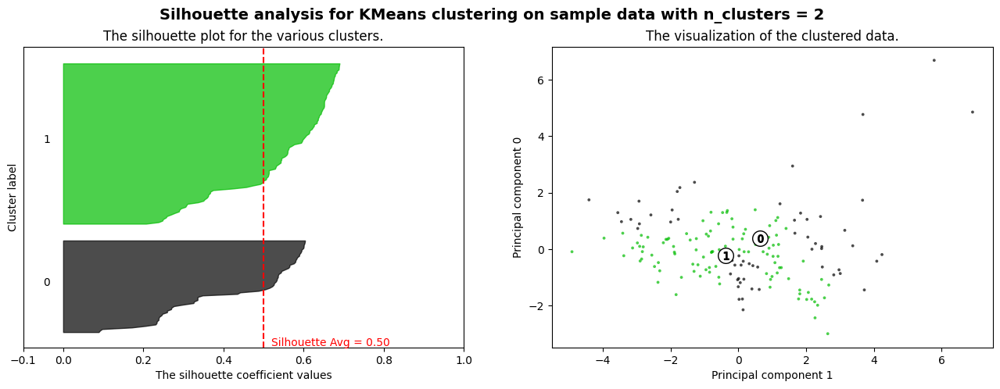

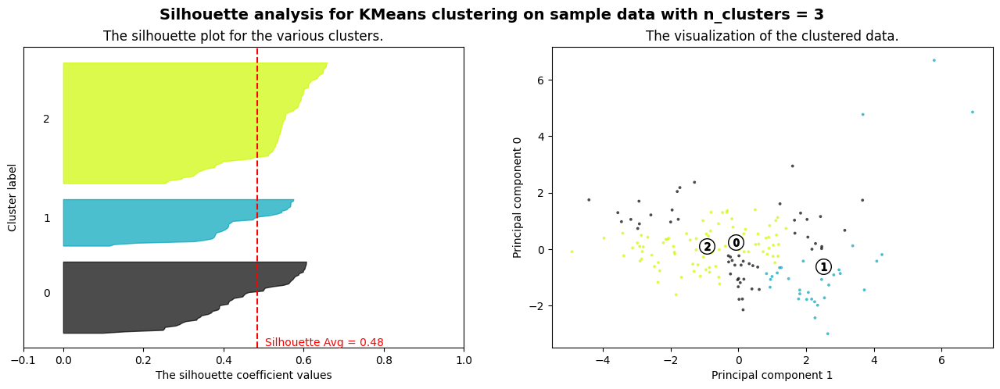

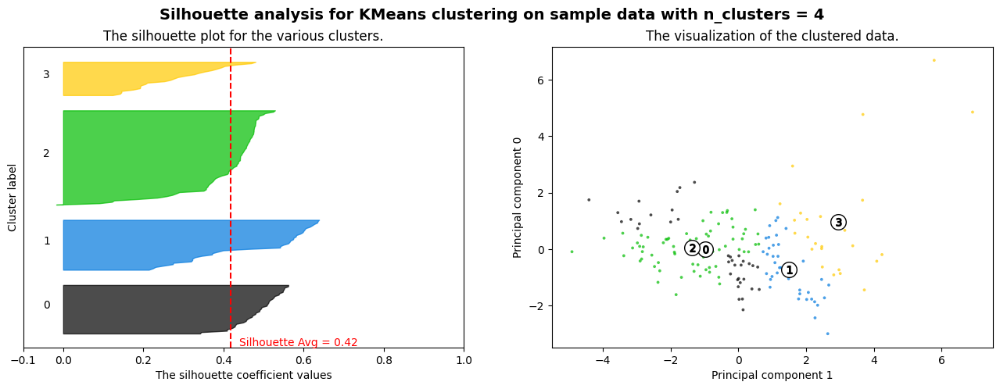

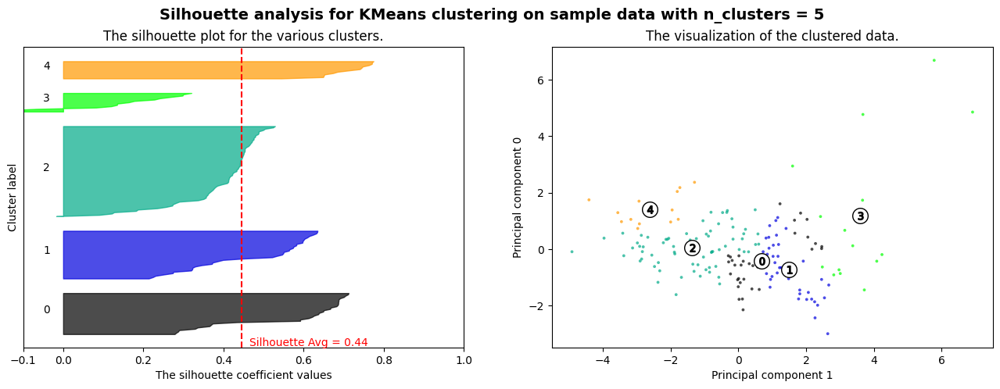

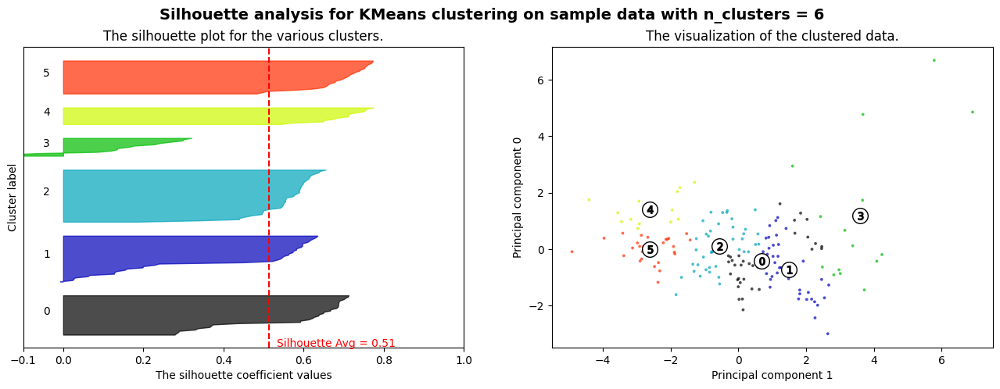

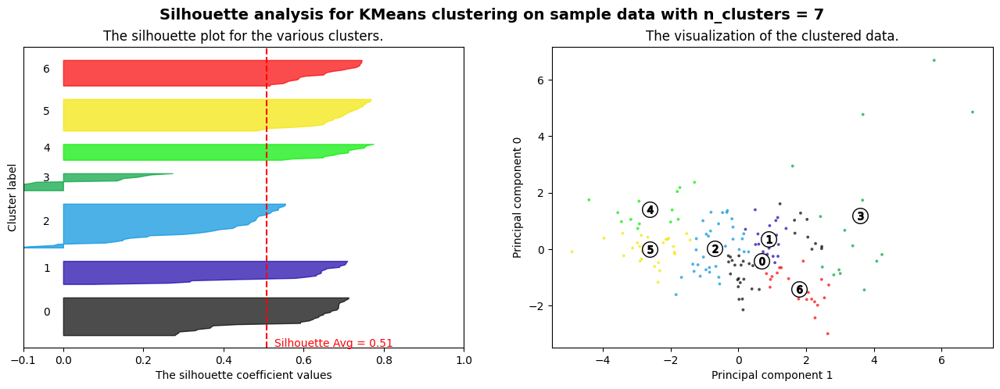

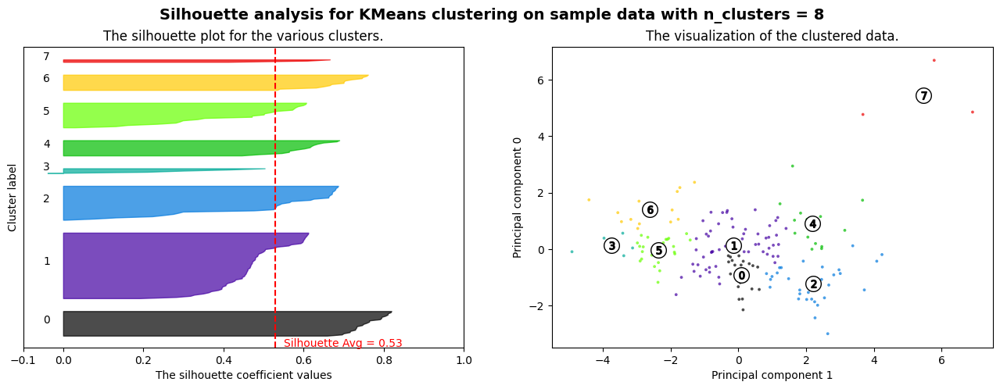

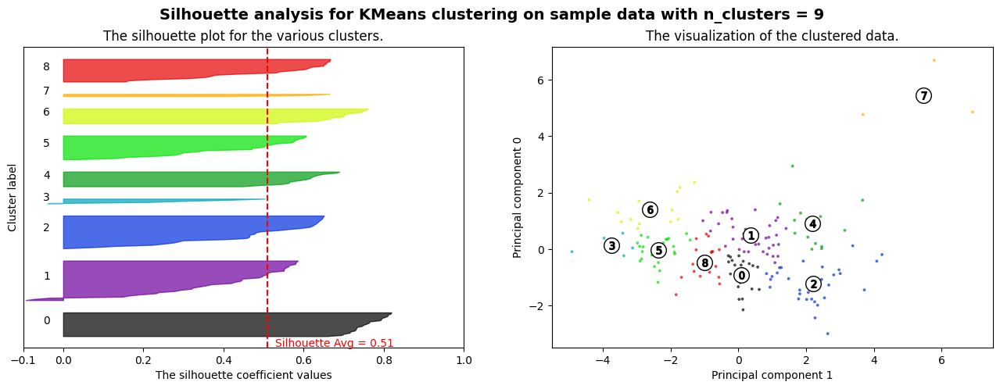

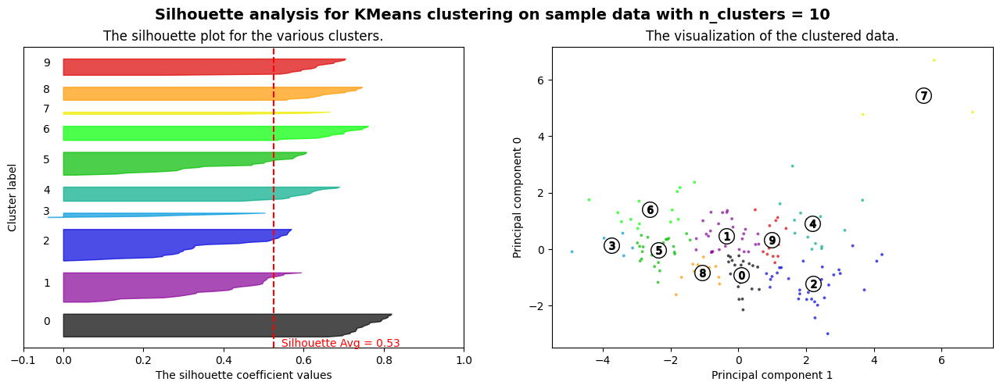

In [ ]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(16, 5)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(principalDf2) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(principalDf2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(principalDf2, cluster_labels)
    print(
        "For k =",
        n_clusters,
        "The average silhouette_score is :",
        round(silhouette_avg, 2)
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(principalDf2, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    # Adds the value of silhouette_avg next to the vertical line
    ax1.text(silhouette_avg + 0.02, 0.9, f'Silhouette Avg = {silhouette_avg:.2f}', color='red', fontsize=10)

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        principalDf2['Principal component 0'], principalDf2['Principal component 1'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Principal component 1")
    ax2.set_ylabel("Principal component 0")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

# TSNE

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=0)

# Ajusta o modelo t-SNE aos seus dados
tsne_components = tsne.fit_transform(df[features])

# Cria um DataFrame com os componentes t-SNE
tsne_df = pd.DataFrame(data=tsne_components, columns=['t-SNE component 1', 't-SNE component 2'])

tsne_df

,t-SNE component 1,t-SNE component 2
0,-8.333389,-0.873607
1,4.106760,0.142166
2,0.995538,4.329207
3,-8.595240,3.574611
4,5.890443,-2.037339
...,...,...
162,-1.048782,-2.010180
163,-0.280574,7.325924
164,3.674529,-4.760836
165,-5.611293,2.990147


## Método (com TSNE)

In [ ]:
# Choosing the number of clusters using the elbow method
inertia = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(tsne_df)
    inertia.append(kmeans.inertia_)

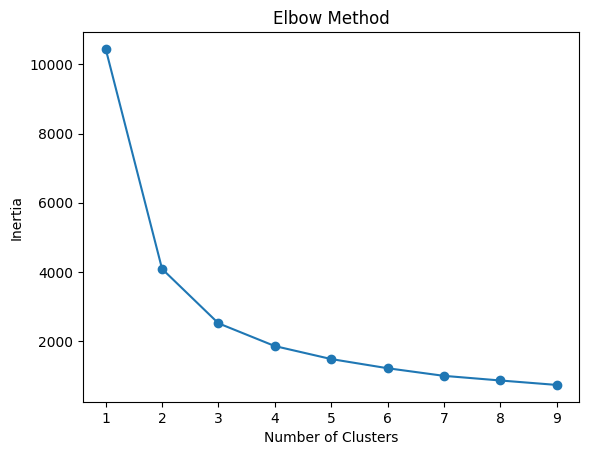

In [ ]:
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

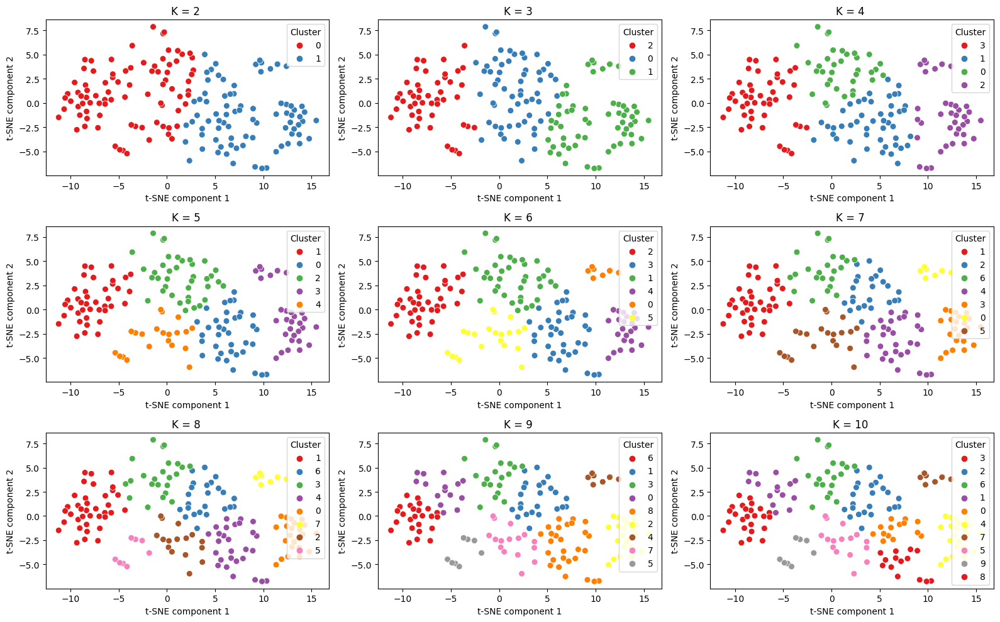

In [ ]:
# Define the number of clusters you want to visualize
num_clusters = 10

slt_scores = [] # To store scores for Silhouette Analysis
dbi_scores = [] # To store scores using the Davies-Boldin Index

# Calculate the number of rows and columns for the grid of plots
rows = (num_clusters + 1) // 3
cols = 3

# Create a grid of subplots
fig, axes = plt.subplots(rows, cols, figsize=(16, 10))

# Loop through each value of k
for k in range(2, num_clusters + 1):
    row = (k - 2) // cols
    col = (k - 2) % cols

    # Apply K-Means with the current value of k
    kmeans = KMeans(n_clusters=k, random_state=0)
    tsne_df['Cluster'] = kmeans.fit_predict(tsne_df)
    tsne_df['Cluster'] = tsne_df['Cluster'].astype(str)

    # calculates and stores silhouette scores
    slt_score = round(metrics.silhouette_score(principalDf, kmeans.labels_, metric='euclidean'), 3)
    slt_scores.append(slt_score)

    # calculates and stores the Davies-Boldin Index
    dbi_score = round(davies_bouldin_score(principalDf, kmeans.labels_), 3)
    dbi_scores.append(dbi_score)

    # Scatter plot of data points with cluster coloring
    ax = sns.scatterplot(ax=axes[row, col], data=tsne_df, s=50, x='t-SNE component 1',
                         y='t-SNE component 2', hue='Cluster', palette='Set1')
    # Add the value of k to the title
    ax.set_title(f'K = {k} ')

# Adjust layout
plt.tight_layout()
plt.show()

## Métricas (com TSNE)

Davies-Boldin Index

In [ ]:
for k in range(2, num_clusters + 1):
  print(f'K={k} -> Davies-Boldin Index: {dbi_scores[k-2]}')

K=2 -> Davies-Boldin Index: 1.741
K=3 -> Davies-Boldin Index: 2.085
K=4 -> Davies-Boldin Index: 1.592
K=5 -> Davies-Boldin Index: 1.77
K=6 -> Davies-Boldin Index: 1.666
K=7 -> Davies-Boldin Index: 1.871
K=8 -> Davies-Boldin Index: 1.989
K=9 -> Davies-Boldin Index: 1.997
K=10 -> Davies-Boldin Index: 1.95


Silhouette Analysis

For k = 2 The average silhouette_score is : 0.44
For k = 3 The average silhouette_score is : 0.39
For k = 4 The average silhouette_score is : 0.37
For k = 5 The average silhouette_score is : 0.4
For k = 6 The average silhouette_score is : 0.43
For k = 7 The average silhouette_score is : 0.45
For k = 8 The average silhouette_score is : 0.53
For k = 9 The average silhouette_score is : 0.52
For k = 10 The average silhouette_score is : 0.51


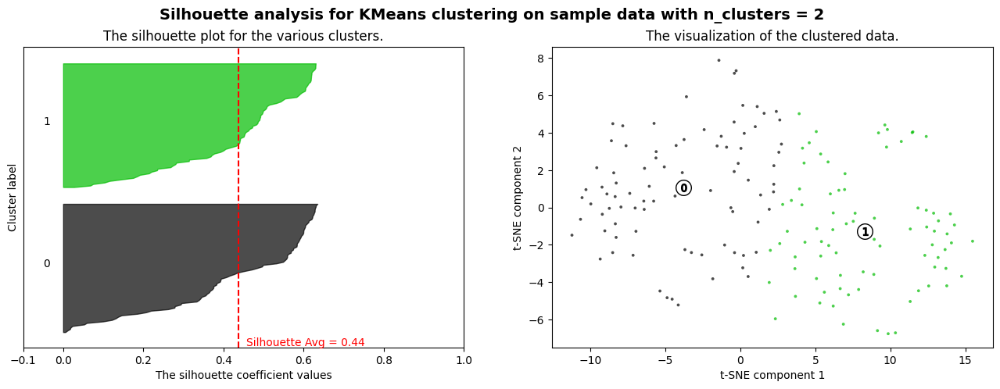

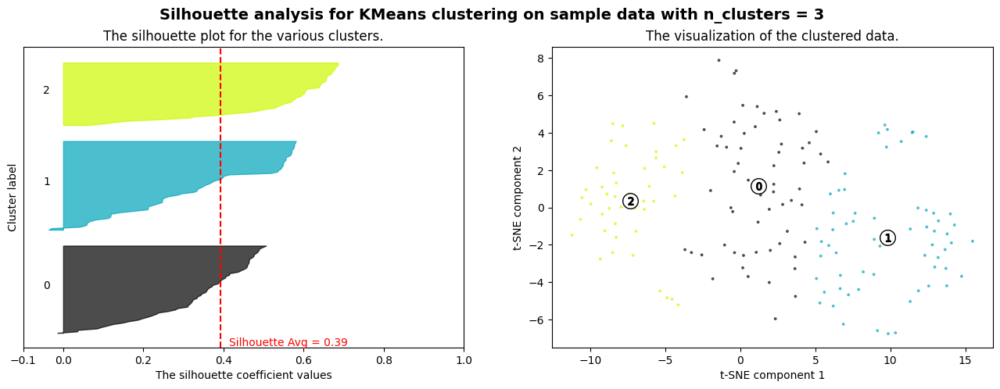

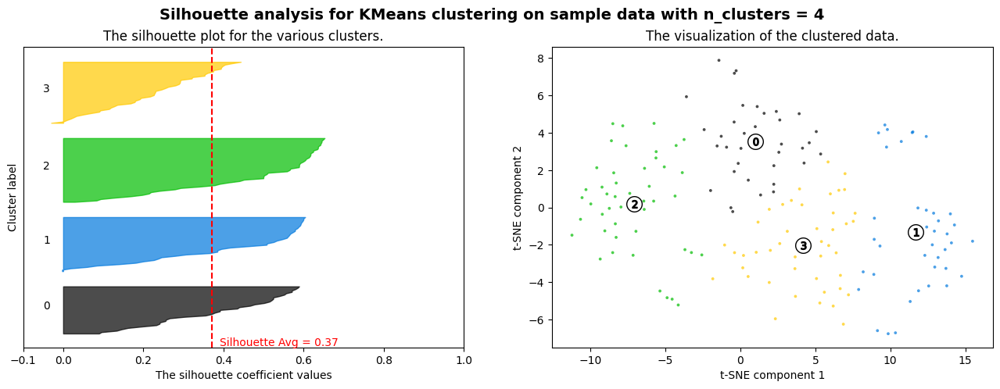

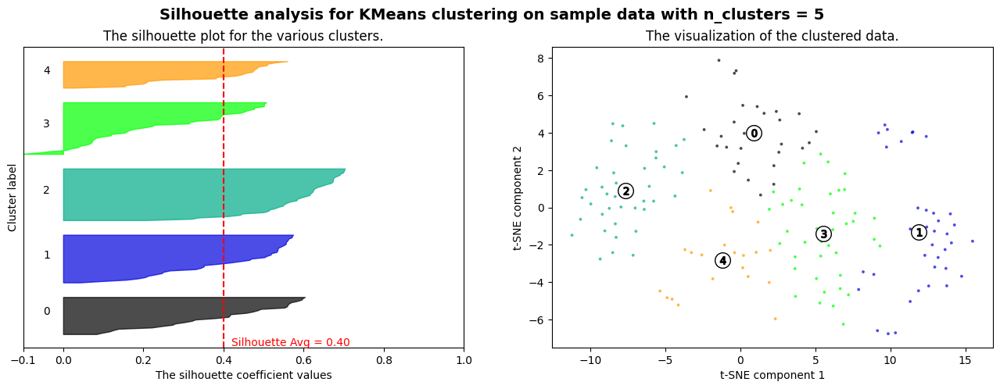

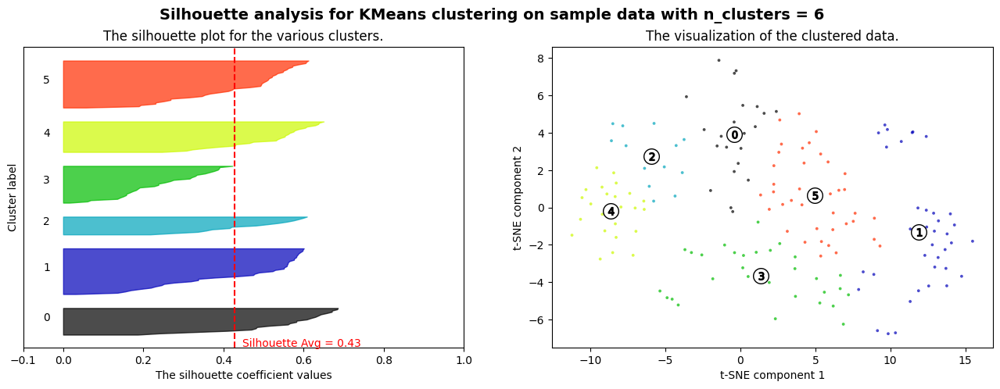

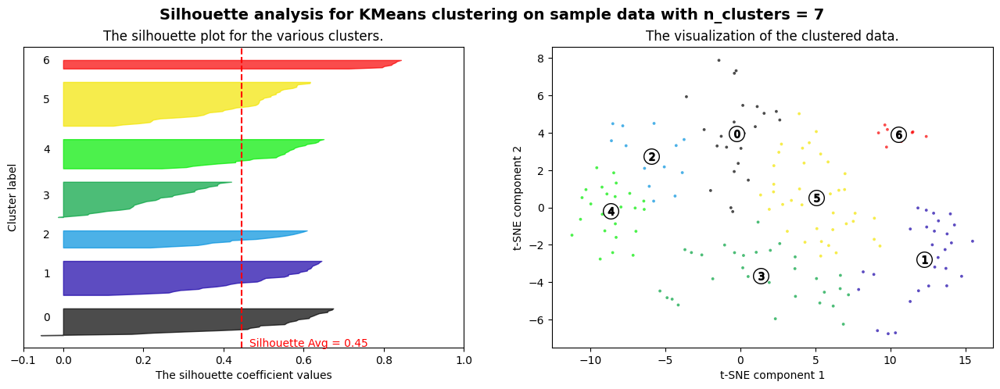

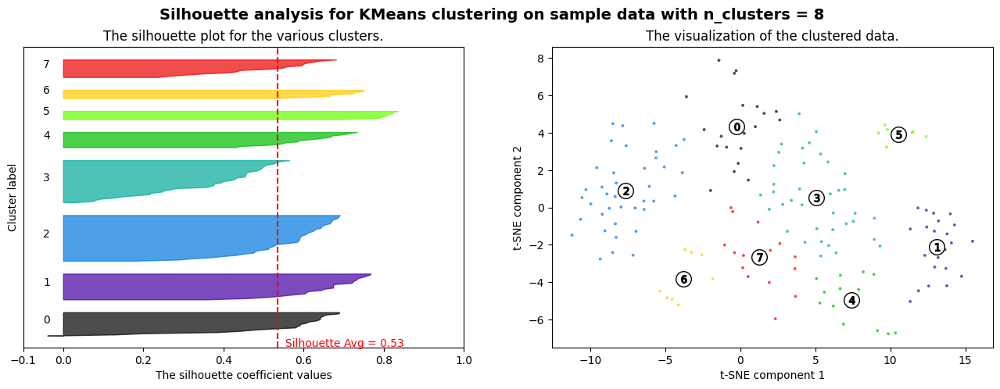

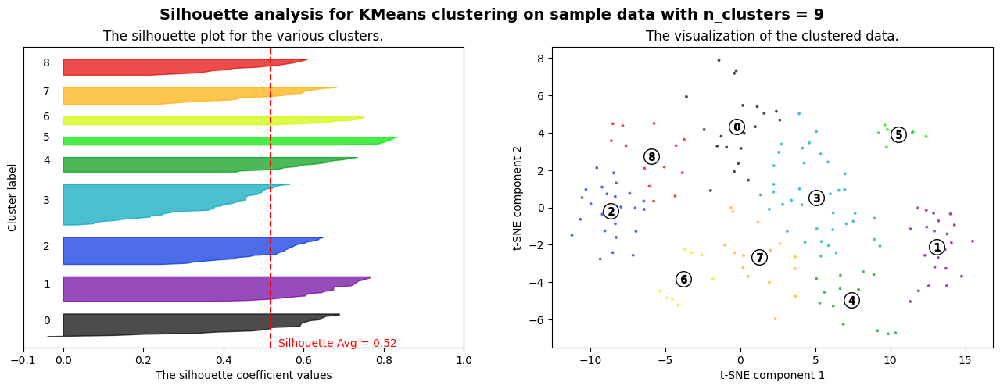

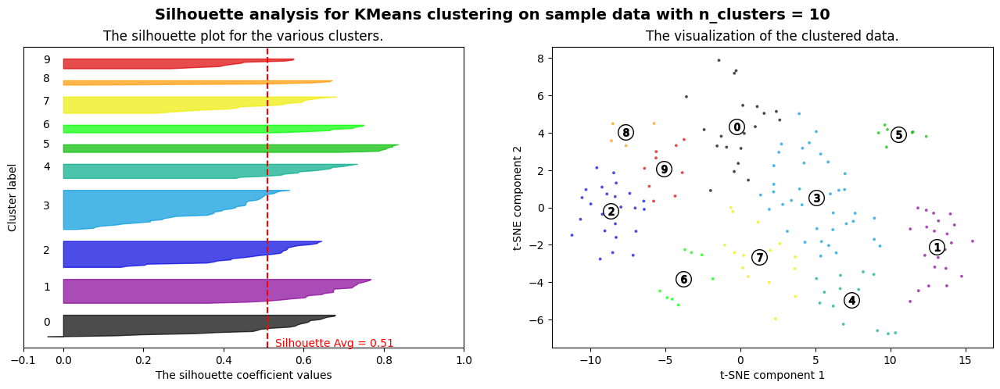

In [ ]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(16, 5)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(tsne_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(tsne_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(tsne_df, cluster_labels)
    print(
        "For k =",
        n_clusters,
        "The average silhouette_score is :",
        round(silhouette_avg, 2)
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(tsne_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    # Adds the value of silhouette_avg next to the vertical line
    ax1.text(silhouette_avg + 0.02, 0.9, f'Silhouette Avg = {silhouette_avg:.2f}', color='red', fontsize=10)

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        tsne_df['t-SNE component 1'], tsne_df['t-SNE component 2'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("t-SNE component 1")
    ax2.set_ylabel("t-SNE component 2")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

# Conclusão

Após a aplicação do PCA, observa-se uma piora da métrica DBI para *k=2* em relação ao DBI obtido sem a aplicação do PCA (5 componentes) e também sem a aplicação do TSNE. Por outro lado, ocorre uma melhora para o PCA (2 componentes) em relação as demais. Já para *k=3*, a métrica é melhor com a aplicação do PCA (2 e 3 componentes) em relação ao TSNE e sem a redução de dimensionalidade:

* K=2 -> Davies-Boldin Index: 1.304 (sem PCA)
* K=2 -> Davies-Boldin Index: 0.834 (PCA - 2 componentes)
* K=2 -> Davies-Boldin Index: 2.496 (PCA - 5 componentes)
* K=2 -> Davies-Boldin Index: 1.741 (TSNE)
* K=3 -> Davies-Boldin Index: 1.277 (sem PCA)
* K=3 -> Davies-Boldin Index: 0.665 (PCA - 2 componentes)
* K=3 -> Davies-Boldin Index: 1.103 (PCA - 5 componentes)
* K=3 -> Davies-Boldin Index: 2.085 (TSNE)

Em relação ao Coeficiente de Silhueta, foi observada uma melhora nas métricas tanto para *k=2* quanto para *k=3* após aplicação do PCA e TSNE:

* k=2 -> average silhouette_score: 0.29 (sem redução)
* k=2 -> average silhouette_score: 0.50 (PCA - 2 componentes)
* k=2 -> average silhouette_score: 0.32 (PCA - 5 componentes)
* k=2 -> average silhouette_score: 0.44 (TSNE)
* k=3 -> average silhouette_score: 0.28 (sem redução)
* k=3 -> average silhouette_score: 0.48 (PCA - 2 componentes)
* k=3 -> average silhouette_score: 0.33 (PCA - 5 componentes)
* k=3 -> average silhouette_score: 0.39 (TSNE)